In [1]:
#필요한 라이브러리를 로드합니다. 
import os
import math
import numpy as np
import tensorflow as tf

from PIL import Image
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.transform import resize
from glob import glob

from tensorflow.keras.models import *
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import *

Albumentation 의 사용법을 간단히 알아보겠습니다. 아래는 Albumentation에서 다양한 augmentation 기법을 확률적으로 적용할 수 있게 해주는 Compose()의 활용예입니다. imgaug의 Sometimes()와 유사한 기능입니다.

In [2]:
from albumentations import  HorizontalFlip, RandomSizedCrop, Compose, OneOf, Resize

def build_augmentation(is_train=True):
  if is_train:    # 훈련용 데이터일 경우
    return Compose([
                    HorizontalFlip(p=0.5),    # 50%의 확률로 좌우대칭
                    RandomSizedCrop(         # 50%의 확률로 RandomSizedCrop
                        min_max_height=(300, 370),
                        w2h_ratio=370/1242,
                        height=224,
                        width=224,
                        p=0.5
                        ),
                    Resize(              # 입력이미지를 224X224로 resize
                        width=224,
                        height=224
                        )
                    ])
  return Compose([      # 테스트용 데이터일 경우에는 224X224로 resize만 수행합니다. 
                Resize(
                    width=224,
                    height=224
                    )
                ])

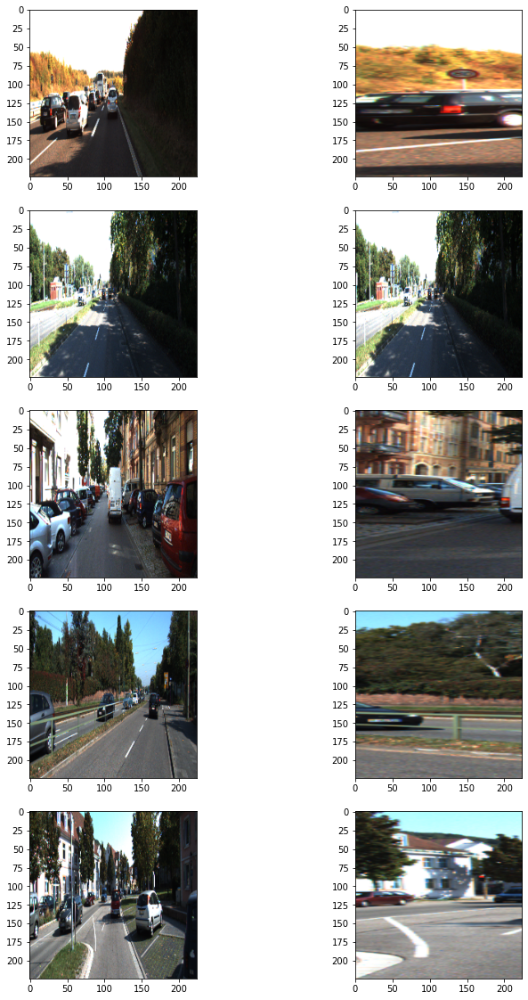

In [3]:
dir_path = os.getenv('HOME')+'/aiffel/semantic_segmentation/data/training'

augmentation_train = build_augmentation()
augmentation_test = build_augmentation(is_train=False)
input_images = glob(os.path.join(dir_path, "image_2", "*.png"))

# 훈련 데이터셋에서 5개만 가져와 augmentation을 적용해 봅시다.  
plt.figure(figsize=(12, 20))
for i in range(5):
    image = imread(input_images[i]) 
    image_data = {"image":image}
    resized = augmentation_test(**image_data)
    processed = augmentation_train(**image_data)
    plt.subplot(5, 2, 2*i+1)
    plt.imshow(resized["image"])  # 왼쪽이 원본이미지
    plt.subplot(5, 2, 2*i+2)
    plt.imshow(processed["image"])  # 오른쪽이 augment된 이미지
  
plt.show()

In [4]:
class KittiGenerator(tf.keras.utils.Sequence):
  '''
  KittiGenerator는 tf.keras.utils.Sequence를 상속받습니다.
  우리가 KittiDataset을 원하는 방식으로 preprocess하기 위해서 Sequnce를 커스텀해 사용합니다.
  '''
  def __init__(self, 
               dir_path,
               batch_size=16,
               img_size=(224, 224, 3),
               output_size=(224, 224),
               is_train=True,
               augmentation=None):
    '''
    dir_path: dataset의 directory path입니다.
    batch_size: batch_size입니다.
    img_size: preprocess에 사용할 입력이미지의 크기입니다.
    output_size: ground_truth를 만들어주기 위한 크기입니다.
    is_train: 이 Generator가 학습용인지 테스트용인지 구분합니다.
    augmentation: 적용하길 원하는 augmentation 함수를 인자로 받습니다.
    '''
    self.dir_path = dir_path
    self.batch_size = batch_size
    self.is_train = is_train
    self.dir_path = dir_path
    self.augmentation = augmentation
    self.img_size = img_size
    self.output_size = output_size

    # load_dataset()을 통해서 kitti dataset의 directory path에서 라벨과 이미지를 확인합니다.
    self.data = self.load_dataset()

  def load_dataset(self):
    # kitti dataset에서 필요한 정보(이미지 경로 및 라벨)를 directory에서 확인하고 로드하는 함수입니다.
    # 이때 is_train에 따라 test set을 분리해서 load하도록 해야합니다.
    input_images = glob(os.path.join(self.dir_path, "image_2", "*.png"))
    label_images = glob(os.path.join(self.dir_path, "semantic", "*.png"))
    input_images.sort()
    label_images.sort()
    assert len(input_images) == len(label_images)
    data = [ _ for _ in zip(input_images, label_images)]

    if self.is_train:
      return data[:-30]
    return data[-30:]
    
  def __len__(self):
    # Generator의 length로서 전체 dataset을 batch_size로 나누고 소숫점 첫째자리에서 올림한 값을 반환합니다.
    return math.ceil(len(self.data) / self.batch_size)

  def __getitem__(self, index):
    # 입력과 출력을 만듭니다.
    # 입력은 resize및 augmentation이 적용된 input image이고 
    # 출력은 semantic label입니다.
    batch_data = self.data[
                           index*self.batch_size:
                           (index + 1)*self.batch_size
                           ]
    inputs = np.zeros([self.batch_size, *self.img_size])
    outputs = np.zeros([self.batch_size, *self.output_size])
        
    for i, data in enumerate(batch_data):
      input_img_path, output_path = data
      _input = imread(input_img_path)
      _output = imread(output_path)
      _output = (_output==7).astype(np.uint8)*1
      data = {
          "image": _input,
          "mask": _output,
          }
      augmented = self.augmentation(**data)
      inputs[i] = augmented["image"]/255
      outputs[i] = augmented["mask"]
      return inputs, outputs

  def on_epoch_end(self):
    # 한 epoch가 끝나면 실행되는 함수입니다. 학습중인 경우에 순서를 random shuffle하도록 적용한 것을 볼 수 있습니다.
    self.indexes = np.arange(len(self.data))
    if self.is_train == True :
      np.random.shuffle(self.indexes)
      return self.indexes

In [5]:
augmentation = build_augmentation()
test_preproc = build_augmentation(is_train=False)
        
train_generator = KittiGenerator(
    dir_path, 
    augmentation=augmentation,
)

test_generator = KittiGenerator(
    dir_path, 
    augmentation=test_preproc,
    is_train=False
)

테스트 셋은 이미지를 제공하지만 정답 데이터를 제공하지 않으니 눈으로 확인할 수 있도록 모델이 추론(inference)한 결과를 우리의 눈으로 볼 수 있는 세그멘테이션 이미지로 만들기

입력 이미지와 라벨을 한 번에 볼 수 있도록 모델의 출력값을 입력 이미지 위에 겹쳐서 보이기, 즉 오버레이(overray) PIL 패키지Image.blend를 활용.

In [142]:
def get_output(model, preproc, image_path, output_path):
     origin_img = imread(image_path)
     data = {"image":origin_img}
     processed = preproc(**data)
     output = model(np.expand_dims(processed["image"]/255,axis=0))
     output = (output[0].numpy()>0.5).astype(np.uint8).squeeze(-1)*255  #0.5라는 threshold를 변경하면 도로인식 결과범위가 달라집니다.
     output = Image.fromarray(output)
     background = Image.fromarray(origin_img).convert('RGBA')
     output = output.resize((origin_img.shape[1], origin_img.shape[0])).convert('RGBA')
     output = Image.blend(background, output, alpha=0.5)
#      output.show()
     return output 

세그멘테이션의 성능을 정량적으로 측정하기 위해 IoU(Intersection over Union)를 계산

In [121]:
def calculate_iou_score(target, prediction):
    intersection = np.logical_and(target, prediction)
    union = np.logical_or(target, prediction)
    iou_score = float(np.sum(intersection)) / float(np.sum(union))
    print('IoU : %f' % iou_score )
    return iou_score

In [122]:
def get_output_label(model, preproc, image_path, output_path, label_path):
    origin_img = imread(image_path)
    data = {"image":origin_img}
    processed = preproc(**data)
    output = model(np.expand_dims(processed["image"]/255,axis=0))
    output = (output[0].numpy()>=0.5).astype(np.uint8).squeeze(-1)*255  #0.5라는 threshold를 변경하면 도로인식 결과범위가 달라집니다.
    prediction = output/255   # 도로로 판단한 영역
    
    output = Image.fromarray(output)
    background = Image.fromarray(origin_img).convert('RGBA')
    output = output.resize((origin_img.shape[1], origin_img.shape[0])).convert('RGBA')
    output = Image.blend(background, output, alpha=0.5)
    output.show()   # 도로로 판단한 영역을 시각화!
     
    if label_path:   
        label_img = imread(label_path)
        label_data = {"image":label_img}
        label_processed = preproc(**label_data)
        label_processed = label_processed["image"]
        target = (label_processed == 7).astype(np.uint8)*1   # 라벨에서 도로로 기재된 영역

        return output, prediction, target
    else:
        return output, prediction, _

## 시멘틱 세그멘테이션

### U-Net

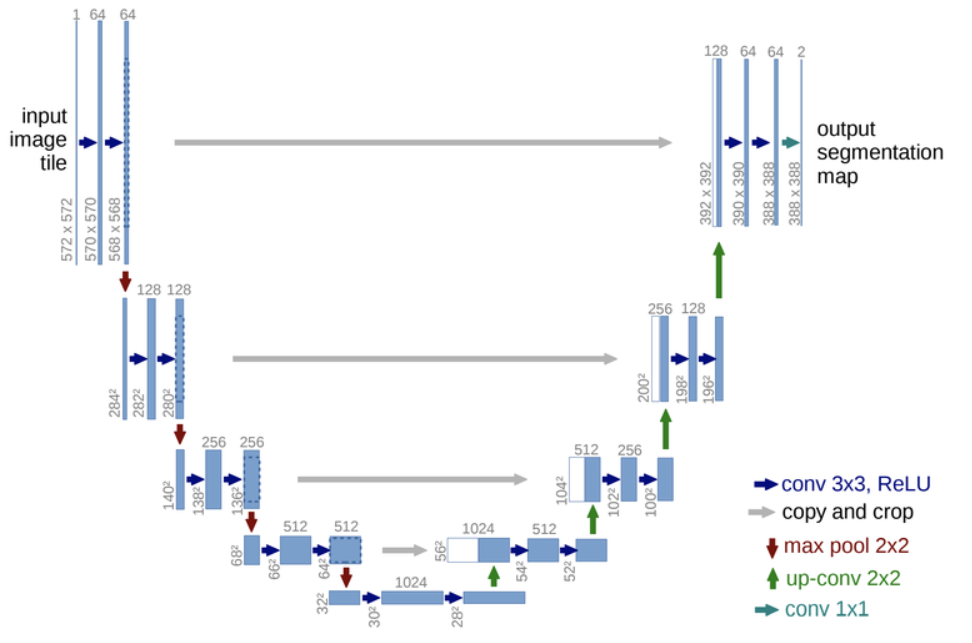

U-Net은 크게 2개의 영역으로 구분되어 있다고 할 수 있습니다.

1. Contracting Path(수축 경로) : 큰 입력 이미지로부터 의미(Context)있는 정보를 추출하는 부분, 일반적인 CNN Architecture가 작동하는 부분과 같습니다.<br/>

2. Expanding Path(확장 경로) : 수축 경로에서 추출된 의미정보와 수축 경로에서 각 Layer에 존재하는 픽셀의
   위치정보를 결합(Skip)하여 Up-Sampling을 진행하는 부분

In [112]:
def unet_model(input_shape=(224, 224, 3)):
  inputs = Input(input_shape)

  #Contracting Path
  conv1 = Conv2D(64, 3, activation='relu', padding='same',kernel_initializer='he_normal')(inputs)
  conv1 = Conv2D(64, 3, activation='relu', padding='same',kernel_initializer='he_normal')(conv1)
  pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)
  conv2 = Conv2D(128, 3, activation='relu', padding='same',kernel_initializer='he_normal')(pool1)
  conv2 = Conv2D(128, 3, activation='relu', padding='same',kernel_initializer='he_normal')(conv2)
  pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)
  conv3 = Conv2D(256, 3, activation='relu', padding='same',kernel_initializer='he_normal')(pool2)
  conv3 = Conv2D(256, 3, activation='relu', padding='same',kernel_initializer='he_normal')(conv3)
  pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)
  conv4 = Conv2D(512, 3, activation='relu', padding='same',kernel_initializer='he_normal')(pool3)
  conv4 = Conv2D(512, 3, activation='relu', padding='same',kernel_initializer='he_normal')(conv4)
  drop4 = Dropout(0.5)(conv4)
  pool4 = MaxPooling2D(pool_size=(2, 2))(drop4)
  
  conv5 = Conv2D(1024, 3, activation='relu', padding='same',kernel_initializer='he_normal')(pool4)  
  conv5 = Conv2D(1024, 3, activation='relu', padding='same',kernel_initializer='he_normal')(conv5)
  
  #Expanding Path
  drop5 = Dropout(0.5)(conv5)
  up6 = Conv2DTranspose(512, 2, activation='relu', strides=(2,2), kernel_initializer='he_normal')(drop5)
  merge6 = concatenate([drop4,up6], axis = 3)
  conv6 = Conv2D(512, 3, activation='relu', padding='same',kernel_initializer='he_normal')(merge6)
  conv6 = Conv2D(512, 3, activation='relu', padding='same',kernel_initializer='he_normal')(conv6)
  up7 = Conv2DTranspose(256, 2, activation='relu', strides=(2,2), kernel_initializer='he_normal')(conv6)
  merge7 = concatenate([conv3,up7], axis = 3)
  conv7 = Conv2D(256, 3, activation='relu', padding='same',kernel_initializer='he_normal')(merge7)
  conv7 = Conv2D(256, 3, activation='relu', padding='same',kernel_initializer='he_normal')(conv7)
  up8 = Conv2DTranspose(128, 2, activation='relu', strides=(2,2), kernel_initializer='he_normal')(conv7)
  merge8 = concatenate([conv2,up8], axis = 3)
  conv8 = Conv2D(128, 3, activation='relu', padding='same',kernel_initializer='he_normal')(merge8)
  conv8 = Conv2D(128, 3, activation='relu', padding='same',kernel_initializer='he_normal')(conv8)
  up9 = Conv2DTranspose(64, 2, activation='relu', strides=(2,2), kernel_initializer='he_normal')(conv8)
  merge9 = concatenate([conv1,up9], axis = 3)
  conv9 = Conv2D(64, 3, activation='relu', padding='same',kernel_initializer='he_normal')(merge9)
  conv9 = Conv2D(64, 3, activation='relu', padding='same',kernel_initializer='he_normal')(conv9)  
  conv9 = Conv2D(2, 3, activation='relu', padding='same',kernel_initializer='he_normal')(conv9)     
  conv10 = Conv2D(1, 1, activation='sigmoid')(conv9)

  model = Model(inputs = inputs, outputs = conv10)
  return model

In [113]:
unet_path = os.getenv('HOME')+'/aiffel/semantic_segmentation/seg_model_unet.h5'

## 프로젝트 : 개선된 U-Net 모델 만들기

### U-Net++

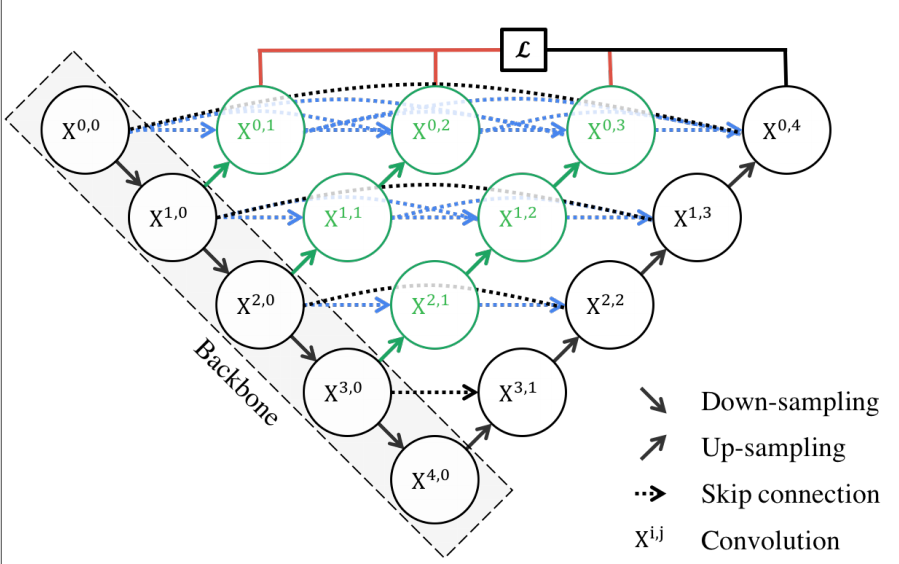
검은색 동그라미와 선은 기존 UNet의 구조를 의미하는 것이고, 파란색 선과 초록색 선은 UNet++의 추가적인 아이디어를 의미

**U-Net과 U-Net++의 차이점**

 1. Re-designed skip pathways : U-Net에서도 Skip-Connection을 해주는 부분이 있었지만, U-Net++에서는 DenseNet의 아이디어를 차용하여 Encoder(수축 경로)와 Decoder(확장 경로)사이의 Semantic(의미적) Gap을 연결시켜 줍니다.

 2. Deep Supervision : 각 브랜치의 출력(빨간색 선으로 표시된 부분)을 평균해서 최종 결과로서 사용하는 방법입니다.
 
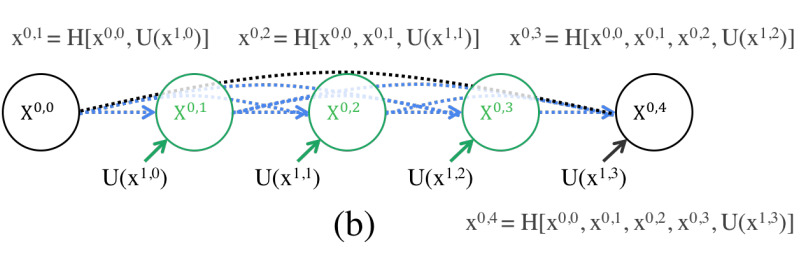
위 그림은 Feature map(이미지)이 첫 번째 Skip Pathway를 통과하는 것을 보여줍니다.

기존 U-Net에서는 X0_0에서 X0_4로 가는 하나의 Skip만이 존재하였습니다. 그러나, U-Net++에서는 X0_0이 크기가 키워진(Upsampling) X1_0과 Concatenate되어 X0_1로 가는 것을 볼 수 있습니다. 그리고 이렇게 만들어진 X0_1은 또 다시 Upsampling된 X1_1과 Concatenate되어 X1_2로 흘려줍니다. 이런식으로 하면 저자들은 Encoder와 Decoder의 Feature map간의 Semantic Gap을 더 줄일 수 있게 된다고 언급합니다.

그리고, Deep Supervision은 여러 Semantic Level(위 구조에서는 4개)은 각각 Feature map을 생성하여 정보를 가지고 있습니다. 따라서, 4개의 시맨틱 정보를 모두 이용하여 평균내어 결과를 예측하였습니다. Deep Supervision 방법은 선택적으로 적용할 수 있습니다.</br></br></br>

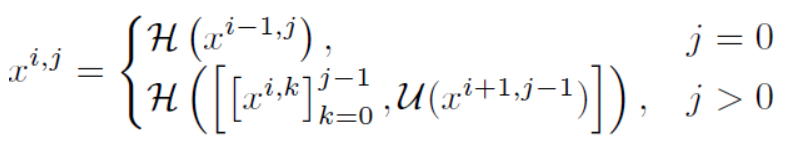

- H()는 convolution 동작 다음의 활성화 함수이며, U()는 up-sampling layer을 나타낸다. 그리고 []는 concatenation layer을 나타낸다.

- 이러한 아이디어는 DenseNet으로부터 온 것이다.

#### Deep Supervision

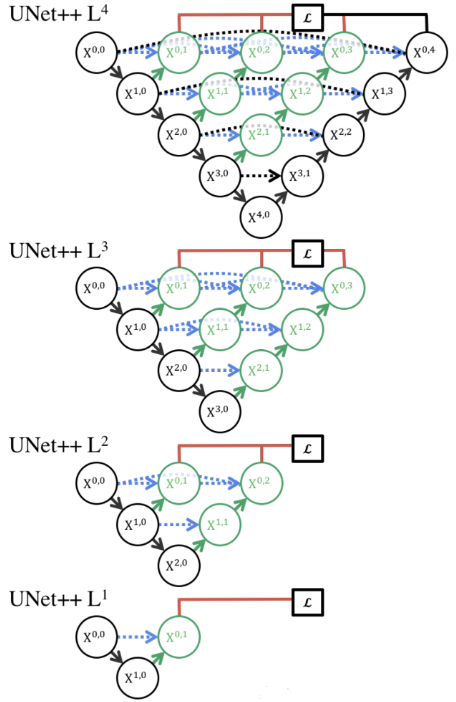

- Deep Supervision은 모든 세그먼테이션 브랜치(segmentation branches)들로 부터 출력된 아웃풋의 평균화하는 정확한 모드나 nal 세그먼이션 맵이 세그멘테이션 브랜치 중 한 개를 선택하는 빠른모드로서, 그러한 선택은 모델 pruning정도와 속도 이득(gain)에 영향을 준다. 

- 중첩된 스킵 경로로 인해, U-Net++는 여러 시맨틱 레벨에서 전체 해상도 특성 맵을 생성한다. 따라서 손신을 4개의 시맨틱 레벨로 부터 예측된다.

In [128]:
def standard_unit(input_tensor, nb_filter, kernel_size=3):
    
    x = Conv2D(nb_filter, (kernel_size, kernel_size), activation='relu', kernel_initializer = 'he_normal', padding='same')(input_tensor)
#     x = Dropout(0.5)(x)
    x = Conv2D(nb_filter, (kernel_size, kernel_size), activation='relu', kernel_initializer = 'he_normal', padding='same')(x)
#     x = Dropout(0.5)(x)

    return x

In [129]:
def Unet_pp(input_shape=(224, 224, 3),num_class=1, deep_supervision=False):
    
    img_input = Input(input_shape)
    bn_axis =3
    nb_filter = [32,64,128,256,512]

    conv1_1 = standard_unit(img_input, nb_filter=nb_filter[0])
    pool1 = MaxPooling2D((2, 2), strides=(2, 2))(conv1_1)

    conv2_1 = standard_unit(pool1, nb_filter=nb_filter[1])
    pool2 = MaxPooling2D((2, 2), strides=(2, 2))(conv2_1)

    up1_2 = Conv2DTranspose(nb_filter[0], (2, 2), strides=(2, 2), padding='same')(conv2_1)
    conv1_2 = concatenate([up1_2, conv1_1], axis=bn_axis)
    conv1_2 = standard_unit(conv1_2, nb_filter=nb_filter[0])

    conv3_1 = standard_unit(pool2, nb_filter=nb_filter[2])
    pool3 = MaxPooling2D((2, 2), strides=(2, 2))(conv3_1)

    up2_2 = Conv2DTranspose(nb_filter[1], (2, 2), strides=(2, 2), padding='same')(conv3_1)
    conv2_2 = concatenate([up2_2, conv2_1], axis=bn_axis)
    conv2_2 = standard_unit(conv2_2, nb_filter=nb_filter[1])

    up1_3 = Conv2DTranspose(nb_filter[0], (2, 2), strides=(2, 2), padding='same')(conv2_2)
    conv1_3 = concatenate([up1_3, conv1_1, conv1_2], axis=bn_axis)
    conv1_3 = standard_unit(conv1_3, nb_filter=nb_filter[0])

    conv4_1 = standard_unit(pool3, nb_filter=nb_filter[3])
    pool4 = MaxPooling2D((2, 2), strides=(2, 2))(conv4_1)

    up3_2 = Conv2DTranspose(nb_filter[2], (2, 2), strides=(2, 2), padding='same')(conv4_1)
    conv3_2 = concatenate([up3_2, conv3_1], axis=bn_axis)
    conv3_2 = standard_unit(conv3_2, nb_filter=nb_filter[2])

    up2_3 = Conv2DTranspose(nb_filter[1], (2, 2), strides=(2, 2), padding='same')(conv3_2)
    conv2_3 = concatenate([up2_3, conv2_1, conv2_2], axis=bn_axis)
    conv2_3 = standard_unit(conv2_3, nb_filter=nb_filter[1])

    up1_4 = Conv2DTranspose(nb_filter[0], (2, 2), strides=(2, 2), padding='same')(conv2_3)
    conv1_4 = concatenate([up1_4, conv1_1, conv1_2, conv1_3], axis=bn_axis)
    conv1_4 = standard_unit(conv1_4, nb_filter=nb_filter[0])

    conv5_1 = standard_unit(pool4, nb_filter=nb_filter[4])

    up4_2 = Conv2DTranspose(nb_filter[3], (2, 2), strides=(2, 2), padding='same')(conv5_1)
    conv4_2 = concatenate([up4_2, conv4_1], axis=bn_axis)
    conv4_2 = standard_unit(conv4_2, nb_filter=nb_filter[3])

    up3_3 = Conv2DTranspose(nb_filter[2], (2, 2), strides=(2, 2), padding='same')(conv4_2)
    conv3_3 = concatenate([up3_3, conv3_1, conv3_2], axis=bn_axis)
    conv3_3 = standard_unit(conv3_3, nb_filter=nb_filter[2])

    up2_4 = Conv2DTranspose(nb_filter[1], (2, 2), strides=(2, 2), padding='same')(conv3_3)
    conv2_4 = concatenate([up2_4, conv2_1, conv2_2, conv2_3], axis=bn_axis)
    conv2_4 = standard_unit(conv2_4, nb_filter=nb_filter[1])

    up1_5 = Conv2DTranspose(nb_filter[0], (2, 2), strides=(2, 2), padding='same')(conv2_4)
    conv1_5 = concatenate([up1_5, conv1_1, conv1_2, conv1_3, conv1_4], axis=bn_axis)
    conv1_5 = standard_unit(conv1_5, nb_filter=nb_filter[0])

    nestnet_output_1 = Conv2D(num_class, (1, 1), activation='sigmoid', kernel_initializer = 'he_normal', padding='same')(conv1_2)
    nestnet_output_2 = Conv2D(num_class, (1, 1), activation='sigmoid', kernel_initializer = 'he_normal', padding='same')(conv1_3)
    nestnet_output_3 = Conv2D(num_class, (1, 1), activation='sigmoid', kernel_initializer = 'he_normal', padding='same')(conv1_4)
    nestnet_output_4 = Conv2D(num_class, (1, 1), activation='sigmoid', kernel_initializer = 'he_normal', padding='same')(conv1_5)

    if deep_supervision:
        model = Model(inputs=img_input, outputs=[nestnet_output_1,
                                               nestnet_output_2,
                                               nestnet_output_3,
                                               nestnet_output_4])
    else:
        model = Model(inputs=img_input, outputs=[nestnet_output_4])

    return model

In [130]:
unet_pp_path = os.getenv('HOME')+'/aiffel/semantic_segmentation/seg_model_unet_pp.h5'

## 모델 학습하기
### U-Net

In [114]:
unet = unet_model()
unet.summary()

Model: "model_6"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_19 (InputLayer)           [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv2d_290 (Conv2D)             (None, 224, 224, 64) 1792        input_19[0][0]                   
__________________________________________________________________________________________________
conv2d_291 (Conv2D)             (None, 224, 224, 64) 36928       conv2d_290[0][0]                 
__________________________________________________________________________________________________
max_pooling2d_41 (MaxPooling2D) (None, 112, 112, 64) 0           conv2d_291[0][0]                 
____________________________________________________________________________________________

In [115]:
unet.compile(optimizer = Adam(1e-4), loss = 'binary_crossentropy')
unet.fit(
     train_generator,
     validation_data=test_generator,
     steps_per_epoch=len(train_generator),
     epochs=100,
 )

unet.save(unet_path)  #학습한 모델을 저장해 주세요.

Epoch 1/100
11/11 [==============================] - 8s 627ms/step - loss: 0.6922 - val_loss: 0.6901
Epoch 2/100
11/11 [==============================] - 7s 612ms/step - loss: 0.6879 - val_loss: 0.6826
Epoch 3/100
11/11 [==============================] - 7s 618ms/step - loss: 0.6795 - val_loss: 0.6647
Epoch 4/100
11/11 [==============================] - 7s 623ms/step - loss: 0.4824 - val_loss: 0.0390
Epoch 5/100
11/11 [==============================] - 7s 594ms/step - loss: 0.0360 - val_loss: 0.0359
Epoch 6/100
11/11 [==============================] - 6s 589ms/step - loss: 0.0325 - val_loss: 0.0337
Epoch 7/100
11/11 [==============================] - 6s 582ms/step - loss: 0.0278 - val_loss: 0.0304
Epoch 8/100
11/11 [==============================] - 6s 578ms/step - loss: 0.0342 - val_loss: 0.0320
Epoch 9/100
11/11 [==============================] - 6s 578ms/step - loss: 0.0298 - val_loss: 0.0371
Epoch 10/100
11/11 [==============================] - 6s 578ms/step - loss: 0.0319 - val_lo

11/11 [==============================] - 6s 582ms/step - loss: 0.0114 - val_loss: 0.0195
Epoch 82/100
11/11 [==============================] - 6s 587ms/step - loss: 0.0087 - val_loss: 0.0194
Epoch 83/100
11/11 [==============================] - 6s 584ms/step - loss: 0.0143 - val_loss: 0.0191
Epoch 84/100
11/11 [==============================] - 6s 583ms/step - loss: 0.0124 - val_loss: 0.0211
Epoch 85/100
11/11 [==============================] - 6s 585ms/step - loss: 0.0149 - val_loss: 0.0202
Epoch 86/100
11/11 [==============================] - 6s 583ms/step - loss: 0.0121 - val_loss: 0.0201
Epoch 87/100
11/11 [==============================] - 6s 585ms/step - loss: 0.0151 - val_loss: 0.0180
Epoch 88/100
11/11 [==============================] - 6s 584ms/step - loss: 0.0110 - val_loss: 0.0178
Epoch 89/100
11/11 [==============================] - 6s 582ms/step - loss: 0.0099 - val_loss: 0.0173
Epoch 90/100
11/11 [==============================] - 6s 585ms/step - loss: 0.0106 - val_loss: 

### U-Net++

In [131]:
unet_pp = Unet_pp()
unet_pp.summary()

Model: "model_9"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_22 (InputLayer)           [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv2d_378 (Conv2D)             (None, 224, 224, 32) 896         input_22[0][0]                   
__________________________________________________________________________________________________
conv2d_379 (Conv2D)             (None, 224, 224, 32) 9248        conv2d_378[0][0]                 
__________________________________________________________________________________________________
max_pooling2d_53 (MaxPooling2D) (None, 112, 112, 32) 0           conv2d_379[0][0]                 
____________________________________________________________________________________________

In [132]:
unet_pp.compile(optimizer = Adam(1e-4), loss = 'binary_crossentropy')
unet_pp.fit(
         train_generator,
         validation_data=test_generator,
         steps_per_epoch=len(train_generator),
         epochs=100,
 )

unet_pp.save(unet_pp_path)

Epoch 1/100
11/11 [==============================] - 9s 637ms/step - loss: 0.6847 - val_loss: 0.6724
Epoch 2/100
11/11 [==============================] - 7s 603ms/step - loss: 0.6582 - val_loss: 0.6246
Epoch 3/100
11/11 [==============================] - 7s 611ms/step - loss: 0.5459 - val_loss: 0.3518
Epoch 4/100
11/11 [==============================] - 7s 617ms/step - loss: 0.1193 - val_loss: 0.0277
Epoch 5/100
11/11 [==============================] - 7s 603ms/step - loss: 0.0289 - val_loss: 0.0277
Epoch 6/100
11/11 [==============================] - 7s 597ms/step - loss: 0.0289 - val_loss: 0.0267
Epoch 7/100
11/11 [==============================] - 6s 587ms/step - loss: 0.0270 - val_loss: 0.0264
Epoch 8/100
11/11 [==============================] - 6s 590ms/step - loss: 0.0256 - val_loss: 0.0278
Epoch 9/100
11/11 [==============================] - 6s 587ms/step - loss: 0.0252 - val_loss: 0.0514
Epoch 10/100
11/11 [==============================] - 6s 586ms/step - loss: 0.0262 - val_lo

11/11 [==============================] - 6s 587ms/step - loss: 0.0138 - val_loss: 0.0357
Epoch 82/100
11/11 [==============================] - 6s 586ms/step - loss: 0.0147 - val_loss: 0.0188
Epoch 83/100
11/11 [==============================] - 6s 586ms/step - loss: 0.0135 - val_loss: 0.0196
Epoch 84/100
11/11 [==============================] - 6s 586ms/step - loss: 0.0131 - val_loss: 0.0185
Epoch 85/100
11/11 [==============================] - 6s 585ms/step - loss: 0.0114 - val_loss: 0.0189
Epoch 86/100
11/11 [==============================] - 6s 587ms/step - loss: 0.0111 - val_loss: 0.0176
Epoch 87/100
11/11 [==============================] - 6s 585ms/step - loss: 0.0090 - val_loss: 0.0174
Epoch 88/100
11/11 [==============================] - 6s 585ms/step - loss: 0.0116 - val_loss: 0.0186
Epoch 89/100
11/11 [==============================] - 6s 587ms/step - loss: 0.0114 - val_loss: 0.0193
Epoch 90/100
11/11 [==============================] - 6s 590ms/step - loss: 0.0100 - val_loss: 

### U-Net++ (deep supervision)

In [133]:
unet_pp_ds_path = os.getenv('HOME')+'/aiffel/semantic_segmentation/seg_model_unet_pp_ds.h5'

In [134]:
unet_pp_ds = Unet_pp(deep_supervision=True)
unet_pp_ds.summary()

Model: "model_10"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_23 (InputLayer)           [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv2d_412 (Conv2D)             (None, 224, 224, 32) 896         input_23[0][0]                   
__________________________________________________________________________________________________
conv2d_413 (Conv2D)             (None, 224, 224, 32) 9248        conv2d_412[0][0]                 
__________________________________________________________________________________________________
max_pooling2d_57 (MaxPooling2D) (None, 112, 112, 32) 0           conv2d_413[0][0]                 
___________________________________________________________________________________________

In [135]:
unet_pp_ds.compile(optimizer = Adam(1e-4), loss = 'binary_crossentropy')
unet_pp_ds.fit(
         train_generator,
         validation_data=test_generator,
         steps_per_epoch=len(train_generator),
         epochs=100,
 )

unet_pp_ds.save(unet_pp_ds_path)

Epoch 1/100
11/11 [==============================] - 10s 675ms/step - loss: 2.7465 - conv2d_442_loss: 0.6905 - conv2d_443_loss: 0.6868 - conv2d_444_loss: 0.6839 - conv2d_445_loss: 0.6853 - val_loss: 2.6993 - val_conv2d_442_loss: 0.6851 - val_conv2d_443_loss: 0.6773 - val_conv2d_444_loss: 0.6678 - val_conv2d_445_loss: 0.6691
Epoch 2/100
11/11 [==============================] - 7s 621ms/step - loss: 2.6372 - conv2d_442_loss: 0.6808 - conv2d_443_loss: 0.6685 - conv2d_444_loss: 0.6457 - conv2d_445_loss: 0.6422 - val_loss: 2.4734 - val_conv2d_442_loss: 0.6729 - val_conv2d_443_loss: 0.6476 - val_conv2d_444_loss: 0.5885 - val_conv2d_445_loss: 0.5644
Epoch 3/100
11/11 [==============================] - 7s 630ms/step - loss: 2.0704 - conv2d_442_loss: 0.6683 - conv2d_443_loss: 0.6230 - conv2d_444_loss: 0.4447 - conv2d_445_loss: 0.3344 - val_loss: 1.4270 - val_conv2d_442_loss: 0.6526 - val_conv2d_443_loss: 0.5618 - val_conv2d_444_loss: 0.1438 - val_conv2d_445_loss: 0.0688
Epoch 4/100
11/11 [=====

11/11 [==============================] - 7s 606ms/step - loss: 0.0879 - conv2d_442_loss: 0.0274 - conv2d_443_loss: 0.0252 - conv2d_444_loss: 0.0229 - conv2d_445_loss: 0.0124 - val_loss: 0.1053 - val_conv2d_442_loss: 0.0293 - val_conv2d_443_loss: 0.0273 - val_conv2d_444_loss: 0.0264 - val_conv2d_445_loss: 0.0224
Epoch 27/100
11/11 [==============================] - 7s 607ms/step - loss: 0.0830 - conv2d_442_loss: 0.0247 - conv2d_443_loss: 0.0228 - conv2d_444_loss: 0.0210 - conv2d_445_loss: 0.0144 - val_loss: 0.1087 - val_conv2d_442_loss: 0.0298 - val_conv2d_443_loss: 0.0283 - val_conv2d_444_loss: 0.0258 - val_conv2d_445_loss: 0.0248
Epoch 28/100
11/11 [==============================] - 7s 606ms/step - loss: 0.0791 - conv2d_442_loss: 0.0248 - conv2d_443_loss: 0.0226 - conv2d_444_loss: 0.0195 - conv2d_445_loss: 0.0123 - val_loss: 0.1038 - val_conv2d_442_loss: 0.0305 - val_conv2d_443_loss: 0.0288 - val_conv2d_444_loss: 0.0251 - val_conv2d_445_loss: 0.0194
Epoch 29/100
11/11 [===============

11/11 [==============================] - 7s 609ms/step - loss: 0.0710 - conv2d_442_loss: 0.0234 - conv2d_443_loss: 0.0208 - conv2d_444_loss: 0.0163 - conv2d_445_loss: 0.0105 - val_loss: 0.1010 - val_conv2d_442_loss: 0.0322 - val_conv2d_443_loss: 0.0278 - val_conv2d_444_loss: 0.0233 - val_conv2d_445_loss: 0.0177
Epoch 52/100
11/11 [==============================] - 7s 606ms/step - loss: 0.0678 - conv2d_442_loss: 0.0227 - conv2d_443_loss: 0.0193 - conv2d_444_loss: 0.0156 - conv2d_445_loss: 0.0102 - val_loss: 0.0886 - val_conv2d_442_loss: 0.0279 - val_conv2d_443_loss: 0.0237 - val_conv2d_444_loss: 0.0200 - val_conv2d_445_loss: 0.0170
Epoch 53/100
11/11 [==============================] - 7s 606ms/step - loss: 0.0664 - conv2d_442_loss: 0.0221 - conv2d_443_loss: 0.0185 - conv2d_444_loss: 0.0143 - conv2d_445_loss: 0.0115 - val_loss: 0.1296 - val_conv2d_442_loss: 0.0377 - val_conv2d_443_loss: 0.0354 - val_conv2d_444_loss: 0.0283 - val_conv2d_445_loss: 0.0281
Epoch 54/100
11/11 [===============

11/11 [==============================] - 7s 607ms/step - loss: 0.0765 - conv2d_442_loss: 0.0215 - conv2d_443_loss: 0.0185 - conv2d_444_loss: 0.0185 - conv2d_445_loss: 0.0180 - val_loss: 0.0862 - val_conv2d_442_loss: 0.0256 - val_conv2d_443_loss: 0.0239 - val_conv2d_444_loss: 0.0179 - val_conv2d_445_loss: 0.0188
Epoch 77/100
11/11 [==============================] - 7s 608ms/step - loss: 0.0670 - conv2d_442_loss: 0.0193 - conv2d_443_loss: 0.0193 - conv2d_444_loss: 0.0146 - conv2d_445_loss: 0.0138 - val_loss: 0.0851 - val_conv2d_442_loss: 0.0263 - val_conv2d_443_loss: 0.0220 - val_conv2d_444_loss: 0.0191 - val_conv2d_445_loss: 0.0178
Epoch 78/100
11/11 [==============================] - 7s 608ms/step - loss: 0.0721 - conv2d_442_loss: 0.0216 - conv2d_443_loss: 0.0194 - conv2d_444_loss: 0.0157 - conv2d_445_loss: 0.0155 - val_loss: 0.0854 - val_conv2d_442_loss: 0.0269 - val_conv2d_443_loss: 0.0228 - val_conv2d_444_loss: 0.0185 - val_conv2d_445_loss: 0.0173
Epoch 79/100
11/11 [===============

## 결과
### U-Net

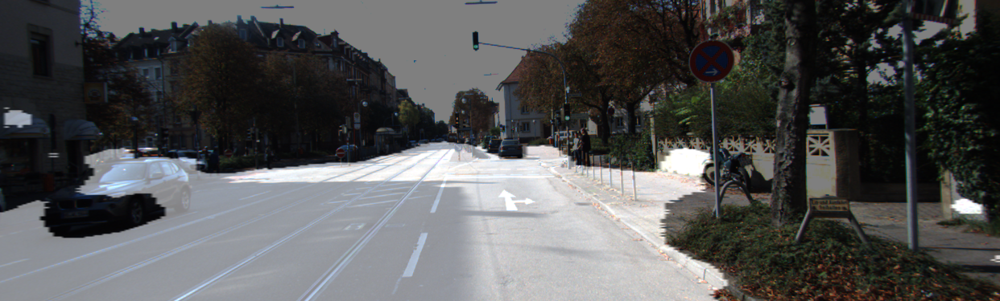

In [143]:
i = 1
get_output(
     unet, 
     test_preproc,
     image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
     output_path=dir_path + f'./result_{str(i).zfill(3)}.png'
 )

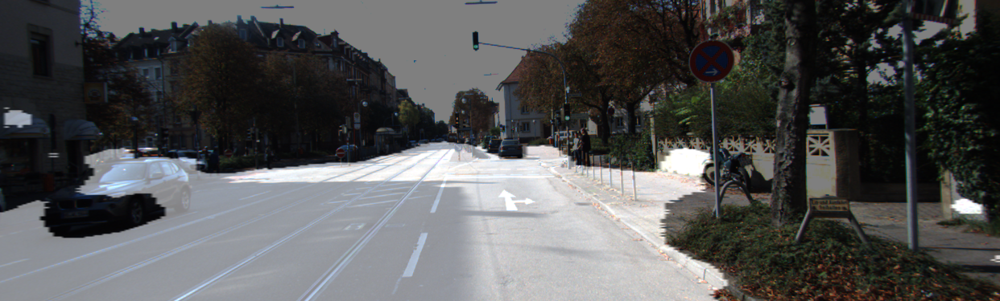

IoU : 0.814104


0.8141042260824475

In [144]:
i = 1
output, prediction, target = get_output_label(
     unet, 
     test_preproc,
     image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
     output_path=dir_path + f'./result_{str(i).zfill(3)}.png',
     label_path=dir_path + f'/semantic/00{str(i).zfill(4)}_10.png'
 )

calculate_iou_score(target, prediction)

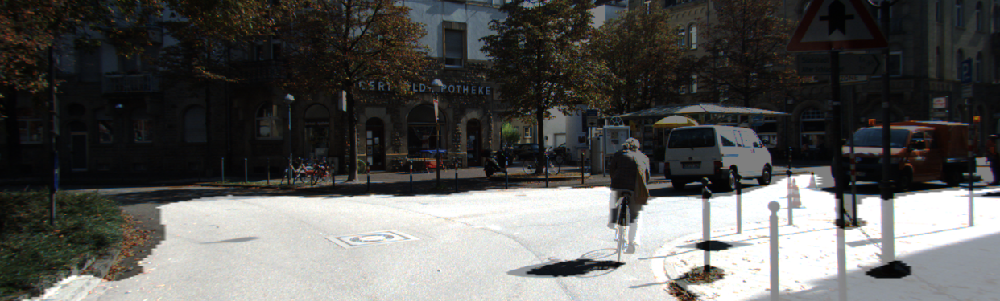

In [162]:
i = 3
get_output(
     unet, 
     test_preproc,
     image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
     output_path=dir_path + f'./result_{str(i).zfill(3)}.png'
 )

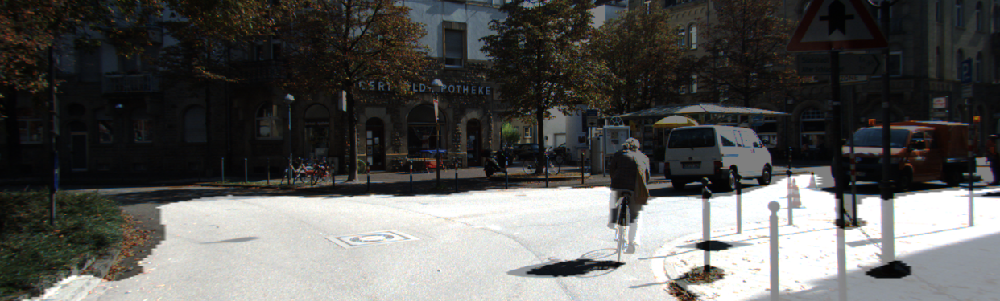

IoU : 0.572192


0.5721915397220367

In [163]:
i = 3
output, prediction, target = get_output_label(
     unet, 
     test_preproc,
     image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
     output_path=dir_path + f'./result_{str(i).zfill(3)}.png',
     label_path=dir_path + f'/semantic/00{str(i).zfill(4)}_10.png'
 )

calculate_iou_score(target, prediction)

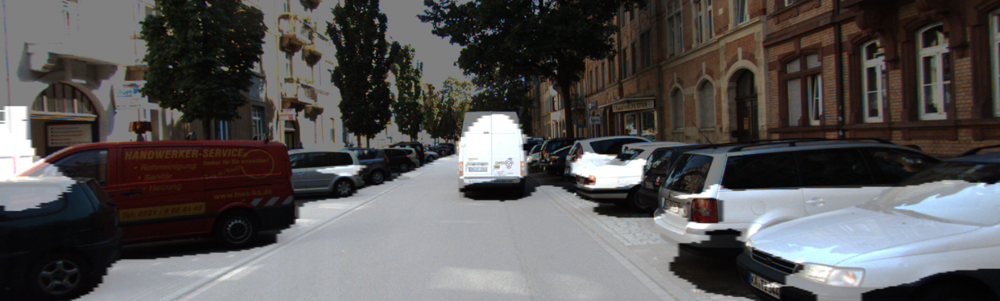

In [168]:
i = 5
get_output(
     unet, 
     test_preproc,
     image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
     output_path=dir_path + f'./result_{str(i).zfill(3)}.png'
 )

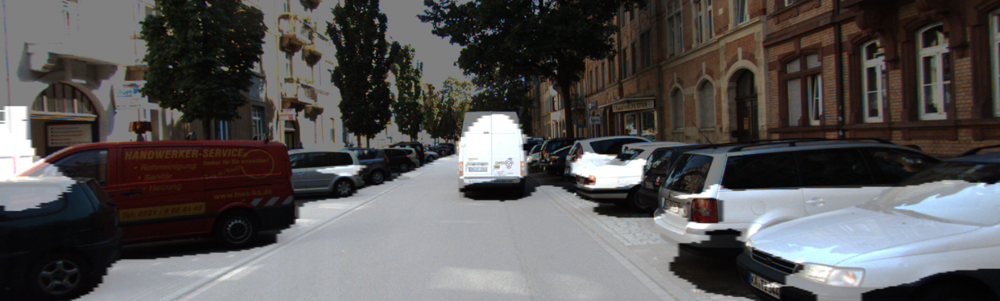

IoU : 0.411901


0.4119011873891088

In [170]:
i = 5
output, prediction, target = get_output_label(
     unet, 
     test_preproc,
     image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
     output_path=dir_path + f'./result_{str(i).zfill(3)}.png',
     label_path=dir_path + f'/semantic/00{str(i).zfill(4)}_10.png'
 )

calculate_iou_score(target, prediction)

### U-Net++

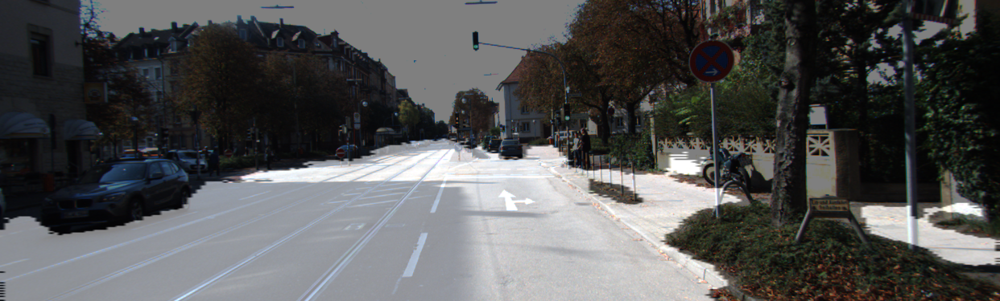

In [145]:
i = 1
get_output(
     unet_pp, 
     test_preproc,
     image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
     output_path=dir_path + f'./result_{str(i).zfill(3)}.png'
 )

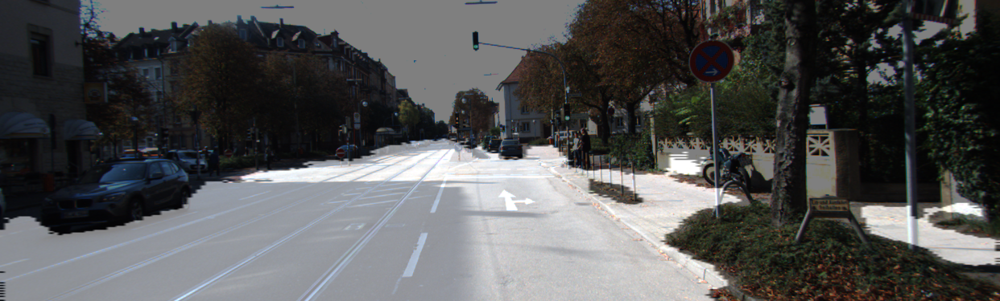

IoU : 0.824282


0.8242815713155813

In [146]:
i = 1
output, prediction, target = get_output_label(
     unet_pp, 
     test_preproc,
     image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
     output_path=dir_path + f'./result_{str(i).zfill(3)}.png',
     label_path=dir_path + f'/semantic/00{str(i).zfill(4)}_10.png'
 )

calculate_iou_score(target, prediction)

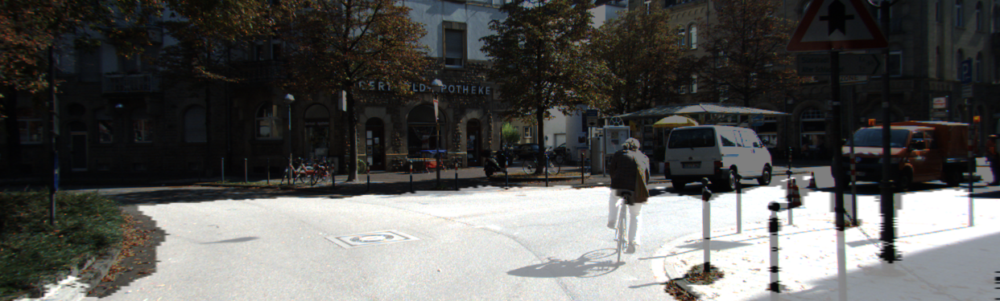

In [164]:
i = 3
get_output(
     unet_pp, 
     test_preproc,
     image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
     output_path=dir_path + f'./result_{str(i).zfill(3)}.png'
 )

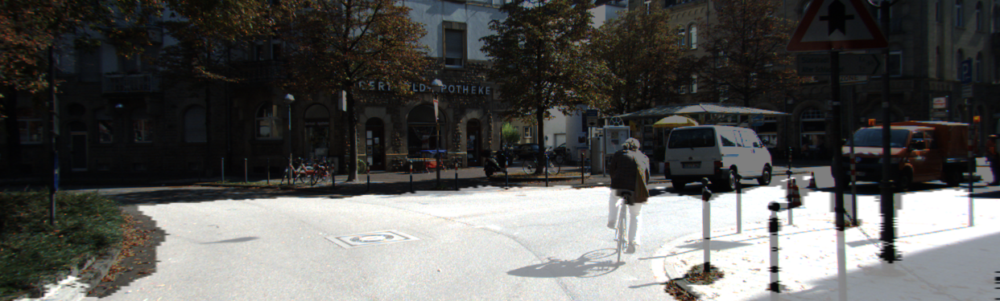

IoU : 0.576450


0.5764496968954749

In [165]:
i = 3
output, prediction, target = get_output_label(
     unet_pp, 
     test_preproc,
     image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
     output_path=dir_path + f'./result_{str(i).zfill(3)}.png',
     label_path=dir_path + f'/semantic/00{str(i).zfill(4)}_10.png'
 )

calculate_iou_score(target, prediction)

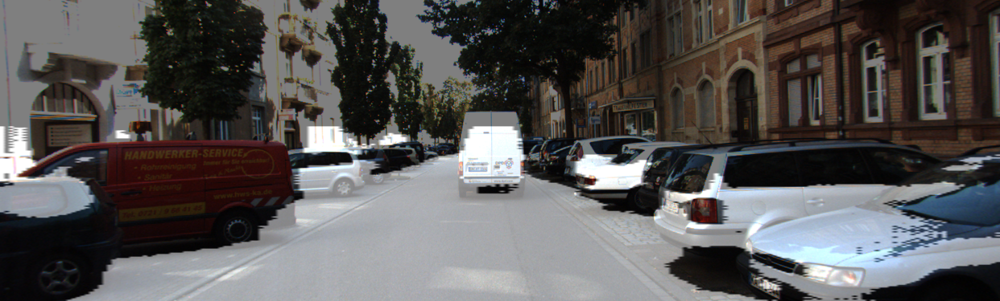

In [171]:
i = 5
get_output(
     unet_pp, 
     test_preproc,
     image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
     output_path=dir_path + f'./result_{str(i).zfill(3)}.png'
 )

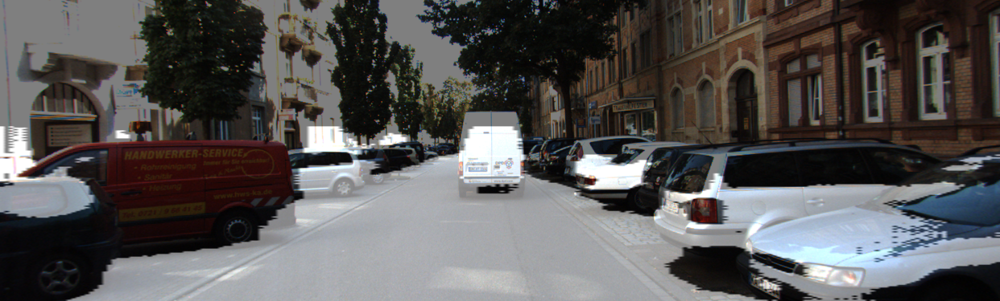

IoU : 0.399020


0.39901992812806275

In [172]:
i = 5
output, prediction, target = get_output_label(
     unet_pp, 
     test_preproc,
     image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
     output_path=dir_path + f'./result_{str(i).zfill(3)}.png',
     label_path=dir_path + f'/semantic/00{str(i).zfill(4)}_10.png'
 )

calculate_iou_score(target, prediction)

### U-Net++ (deep supervision)

- output값이 4개이기에 이 출력 값을 결합하기 위해 평균을 사용

In [159]:
def get_output_ds(model, preproc, image_path, output_path):
    origin_img = imread(image_path)
    data = {"image":origin_img}
    processed = preproc(**data)
    output = np.mean(model(np.expand_dims(processed["image"]/255,axis=0)), axis=0)
    output = (output[0]>0.5).astype(np.uint8).squeeze(-1)*255  #0.5라는 threshold를 변경하면 도로인식 결과범위가
    output = Image.fromarray(output)
    background = Image.fromarray(origin_img).convert('RGBA')
    output = output.resize((origin_img.shape[1], origin_img.shape[0])).convert('RGBA')
    output = Image.blend(background, output, alpha=0.5)
    return output 

In [154]:
def get_output_label_ds(model, preproc, image_path, output_path, label_path):
    origin_img = imread(image_path)
    data = {"image":origin_img}
    processed = preproc(**data)
    output = np.mean(model(np.expand_dims(processed["image"]/255,axis=0)), axis=0)
    output = (output[0]>=0.5).astype(np.uint8).squeeze(-1)*255  #0.5라는 threshold를 변경하면 도로인식 결과범위가 달라집니다.
    prediction = output/255   # 도로로 판단한 영역
    
    output = Image.fromarray(output)
    background = Image.fromarray(origin_img).convert('RGBA')
    output = output.resize((origin_img.shape[1], origin_img.shape[0])).convert('RGBA')
    output = Image.blend(background, output, alpha=0.5)
    output.show()   # 도로로 판단한 영역을 시각화!
     
    if label_path:   
        label_img = imread(label_path)
        label_data = {"image":label_img}
        label_processed = preproc(**label_data)
        label_processed = label_processed["image"]
        target = (label_processed == 7).astype(np.uint8)*1   # 라벨에서 도로로 기재된 영역

        return output, prediction, target
    else:
        return output, prediction, _

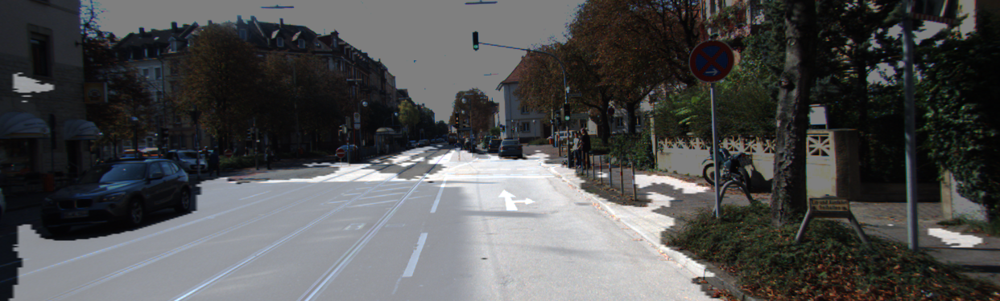

In [160]:
i = 1
get_output_ds(
     unet_pp_ds, 
     test_preproc,
     image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
     output_path=dir_path + f'./result_{str(i).zfill(3)}.png'
 )

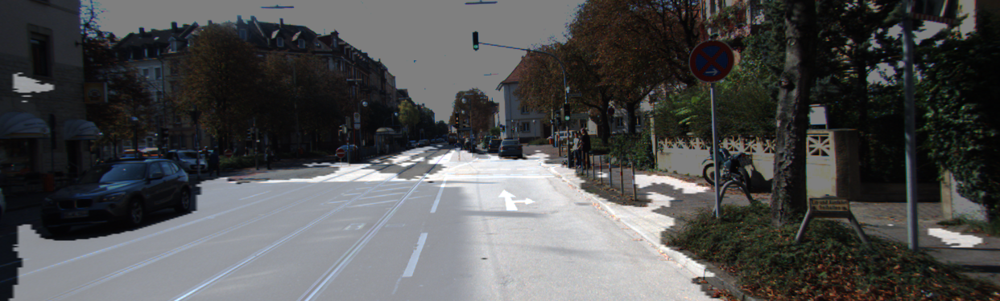

IoU : 0.857624


0.8576241394463161

In [161]:
i = 1
output, prediction, target = get_output_label_ds(
     unet_pp_ds, 
     test_preproc,
     image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
     output_path=dir_path + f'./result_{str(i).zfill(3)}.png',
     label_path=dir_path + f'/semantic/00{str(i).zfill(4)}_10.png'
 )

calculate_iou_score(target, prediction)

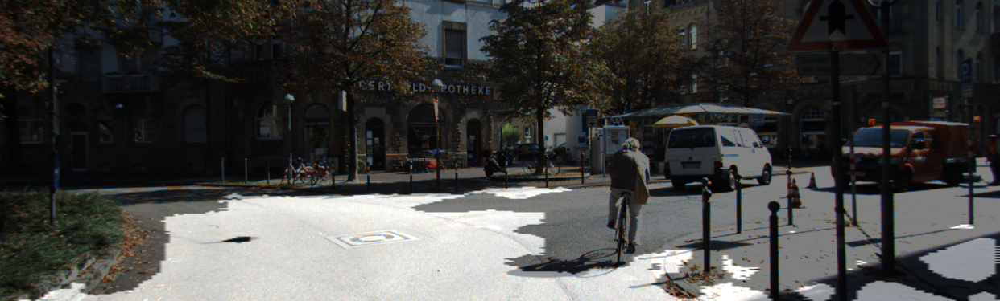

In [166]:
i = 3
get_output_ds(
     unet_pp_ds, 
     test_preproc,
     image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
     output_path=dir_path + f'./result_{str(i).zfill(3)}.png'
 )

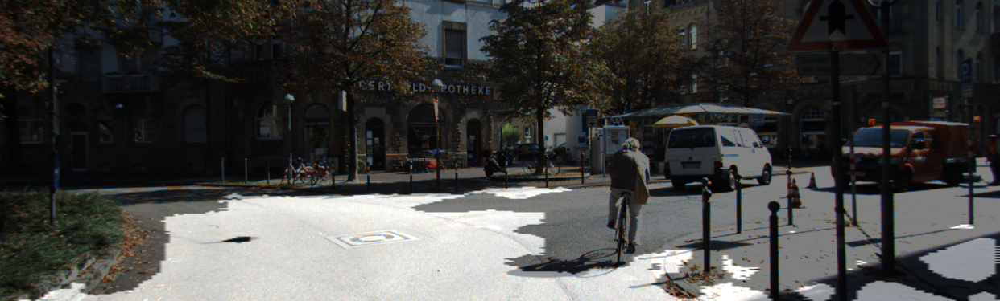

IoU : 0.568944


0.5689444036247857

In [167]:
i = 3
output, prediction, target = get_output_label_ds(
     unet_pp_ds, 
     test_preproc,
     image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
     output_path=dir_path + f'./result_{str(i).zfill(3)}.png',
     label_path=dir_path + f'/semantic/00{str(i).zfill(4)}_10.png'
 )

calculate_iou_score(target, prediction)

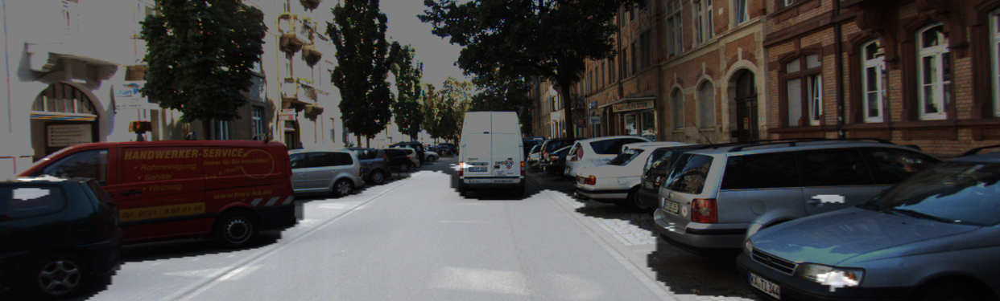

In [173]:
i = 5
get_output_ds(
     unet_pp_ds, 
     test_preproc,
     image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
     output_path=dir_path + f'./result_{str(i).zfill(3)}.png'
 )

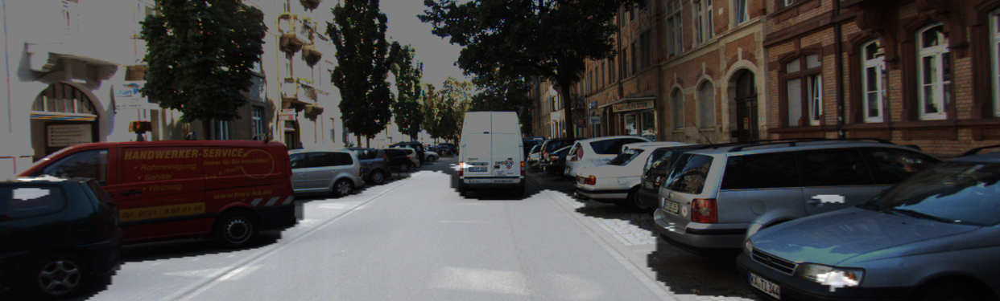

IoU : 0.738025


0.7380246913580247

In [174]:
i = 5
output, prediction, target = get_output_label_ds(
     unet_pp_ds, 
     test_preproc,
     image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
     output_path=dir_path + f'./result_{str(i).zfill(3)}.png',
     label_path=dir_path + f'/semantic/00{str(i).zfill(4)}_10.png'
 )

calculate_iou_score(target, prediction)

U-Net
1 : 0.814104
3 : 0.572192
5 : 0.411901

U-Net++
1 : 0.824282
3 : 0.576450
5 : 0.399020

U-Net++ (deep supervision)
1 : 0.857624
3 : 0.568944
5 : 0.738025

- 사진마다 조금씩을 다르지만 대체로 